In [34]:
import pandas as pd
import sys

sys.path.append('../../')
from src.plot_helpers import plot_experiment_range,plot_correlation_matrix
from src.transform import transform_diff_avg,load_json

kaiterra_cols = load_json("../../json/locations.json")["kaiterra"]


## Load data

In [35]:
df = pd.read_csv('../../data/clean_data/all_sensors.csv',index_col=0,parse_dates=True)
df

/tmp/ipykernel_2032864/2544046345.py:1: DtypeWarning:

Columns (6,26) have mixed types. Specify dtype option on import or set low_memory=False.



,aqi_palas,averaging,cn,co,co2,dcn,formaldehyde,global_error,humidity,indoor_nox_index,...,temperature,tvoc,tvoc_ppb,voc,volume_flow,x10_dcn,x16_dcn,x50_dcn,x84_dcn,x90_dcn
2024-10-11 13:24:18,NaN,NaN,NaN,NaN,566.00,NaN,3.0,NaN,58.00,NaN,...,20.50,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:33:57,NaN,NaN,NaN,NaN,528.00,NaN,11.0,NaN,58.00,NaN,...,21.00,87.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:43:57,NaN,NaN,NaN,NaN,596.00,NaN,36.0,NaN,57.00,NaN,...,22.20,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:44:34,NaN,NaN,NaN,NaN,675.00,NaN,42.0,NaN,57.00,NaN,...,22.70,103.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2024-10-11 13:54:27,NaN,NaN,NaN,NaN,701.00,NaN,41.0,NaN,57.00,NaN,...,23.00,102.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-11-05 16:17:00,56.47,60.0,1112.10,NaN,996.77,->,NaN,0.0,51.54,NaN,...,22.17,NaN,NaN,0.06,1.0,0.19,0.2,0.24,0.3,0.34
2024-11-05 16:18:00,58.78,60.0,1140.10,NaN,1025.73,->,NaN,0.0,50.25,NaN,...,22.78,NaN,NaN,0.09,1.0,0.19,0.2,0.24,0.3,0.33
2024-11-05 16:19:00,60.80,60.0,1142.41,NaN,1034.32,->,NaN,0.0,51.30,NaN,...,23.02,NaN,NaN,0.09,1.0,0.19,0.2,0.24,0.3,0.33
2024-11-05 16:20:00,62.53,60.0,1154.18,NaN,1011.70,->,NaN,0.0,48.37,NaN,...,23.13,NaN,NaN,0.07,1.0,0.19,0.2,0.24,0.3,0.33


In [36]:
df_kaiterra = df.loc[df['sensor'] == 'kaiterra'][kaiterra_cols]
df_kaiterra



,pm_10,pm_2.5,tvoc_ppb,co2,humidity,temperature,overall_index,primary_pollutant
2024-10-11 13:42:04,6.0,6.0,0.0,615.0,56.95,22.73,25.0,PM2.5
2024-10-11 13:43:02,0.0,0.0,0.0,682.0,57.50,22.72,23.0,CO2
2024-10-11 13:44:02,0.0,0.0,0.0,670.0,57.79,22.73,22.0,CO2
2024-10-11 13:45:02,1.0,0.0,0.0,682.0,57.93,22.77,23.0,CO2
2024-10-11 13:46:02,0.0,0.0,0.0,682.0,58.18,22.82,23.0,CO2
...,...,...,...,...,...,...,...,...
2024-10-31 11:22:32,51.0,48.0,11640.0,727.0,53.97,24.13,500.0,TVOC
2024-10-31 11:23:32,50.0,48.0,12030.0,736.0,54.06,24.13,500.0,TVOC
2024-10-31 11:24:32,56.0,52.0,12060.0,738.0,54.18,24.15,500.0,TVOC
2024-10-31 11:25:32,52.0,49.0,12330.0,738.0,54.20,24.19,500.0,TVOC


## Correlation matrix

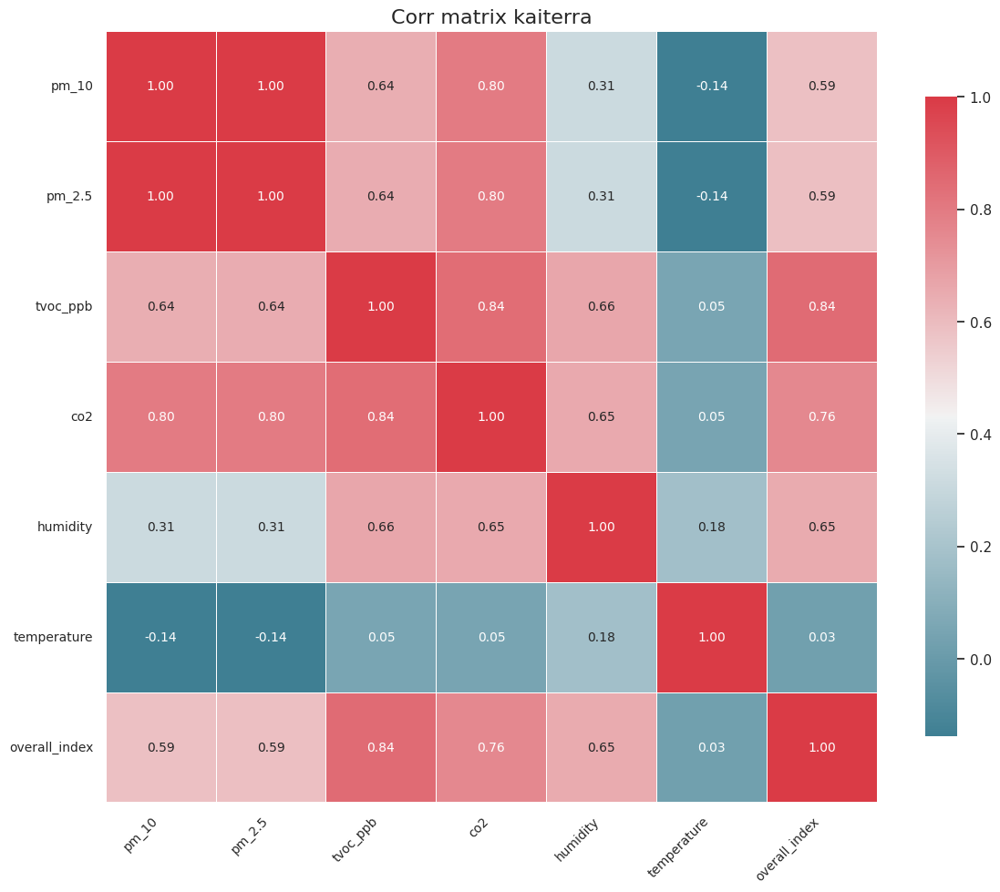

In [37]:
plot_correlation_matrix(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).corr(),title=f"Corr matrix kaiterra")

## PAHs

### Time series plots

In [38]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean(),col_names=['pm_10','pm_2.5'],max_value=200,start_date="2024-10-16 07:15",end_date="2024-11-02 07:15")


### Diff plot

In [19]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean().diff(),col_names=['pm_10','pm_2.5'])

### diff percentage plot

In [20]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean().pct_change() * 100,col_names=['pm_10','pm_2.5'],max_value=50,min_value=-75)

/tmp/ipykernel_2032864/3506115237.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## TVOC_ppb

### Time Series

In [21]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean(),col_names=['tvoc_ppb'])

### diff plot

In [22]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean().pct_change() * 100,col_names=['tvoc_ppb'],min_value=-70,max_value=70)

/tmp/ipykernel_2032864/3135234271.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## CO2

### Time series

In [23]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean(),col_names=['co2'])

### diff plot

In [24]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean().pct_change() * 100,col_names=['co2'])

/tmp/ipykernel_2032864/1684971646.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## Overall index, Temperature and Humidity

### time series plot

In [25]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean(),col_names=['overall_index','temperature','humidity'])



### diff plot

In [26]:
plot_experiment_range(df=df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean().pct_change()* 100,col_names=['overall_index','temperature','humidity'],min_value=-100,max_value=100)


/tmp/ipykernel_2032864/1244022799.py:1: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



## Overall analysis

In [27]:
diff_df = transform_diff_avg(df_kaiterra.select_dtypes(include=['int64', 'float64']).resample('240s').mean())
diff_df.dropna(axis=1,inplace=True)

/home/usr1_tt/collocation_study/notebooks/sensor/../../src/transform.py:16: FutureWarning:

The default fill_method='pad' in DataFrame.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.



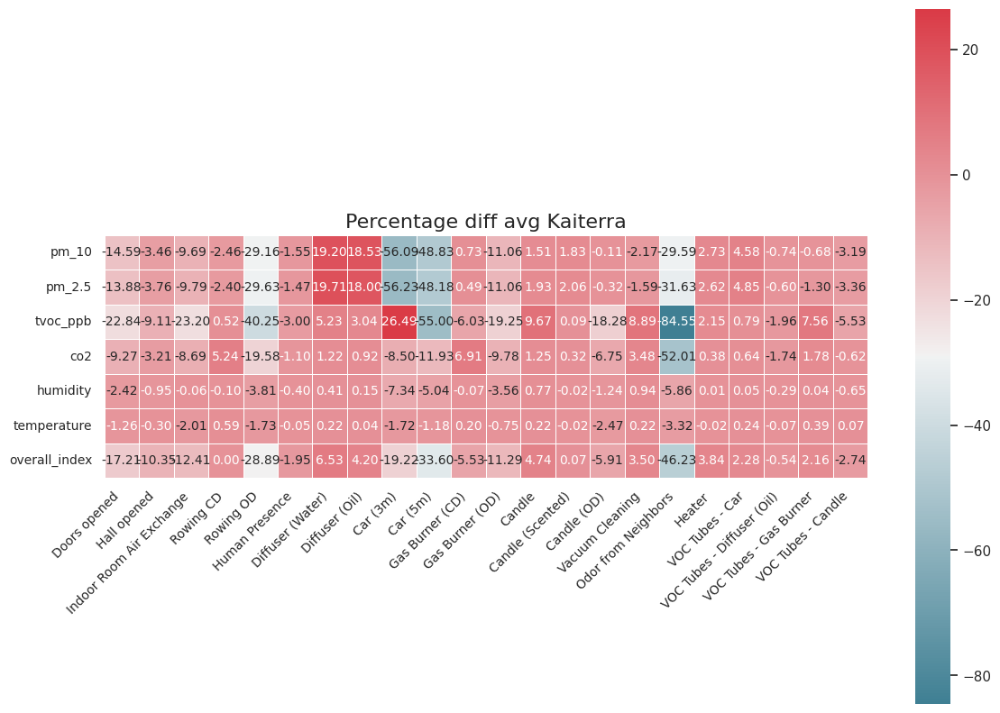

In [28]:
plot_correlation_matrix(diff_df,title="Percentage diff avg Kaiterra")